# Custom Data Model Training Virtual Environment

This notebook is designed to run in a virtual environment which will avoid various issues during the custom data model training. 

### NOTE: Running this notebook takes a few hours.

# Library Installation

Pip install (recommended in virtual environment).

In [ ]:
!pip install ultralytics

In [ ]:
!pip install roboflow

# Python Libraries

In [ ]:
import os

from roboflow import Roboflow
from ultralytics import YOLO

from IPython.display import display, Image

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import urllib.request
from io import BytesIO

In [ ]:
# Check Installation of YOLO
!yolo mode=checks

# GPU Utilization Stats (PC Platform)

In [ ]:
# Checks GPU Utilization
nvidia-smi

In [ ]:
# Realtime GPU Utilization
watch -n 1 nvidia-smi

In [ ]:
import GPUtil

gpus = GPUtil.getGPUs()
for gpu in gpus:
    print(f"GPU {gpu.id}: {gpu.name}")
    print(f"-Memory usage: {gpu.memoryUsed} / {gpu.memoryTotal} MB")
    print(f"-GPU utilization: {gpu.load * 100}%")
    print(f"-Temperature: {gpu.temperature} °C")

# Download Dataset

### Alternative 1: Automatic Download
In our case, we are downloading a dataset that is uploaded into Roboflow application. In such case, we can make a call for the roboflow data using the Roboflow's Application Programming Interface (API).

In [ ]:
rf = Roboflow(api_key="deO5u1tP8oXg2HyoSRT4") # User Specific Key
project = rf.workspace("objet-detect-yolov5").project("eep_detection-u9bbd")
version = project.version(1)
dataset = version.download("yolov8")

### Alternative 2: Manual Download
One alternative is to manually download the files and put them into the dataset directsory within the notebook main directory. This method needs to be used if the data was manually collected, annotated, and labeled.

Within Roboflow, you can manually download the files. If selecting such method, we need to put the files in the dataset directory within the notebook main directory. If the custom dataset was collected and annotated outside of roboflow follow the directories and paths below as well.
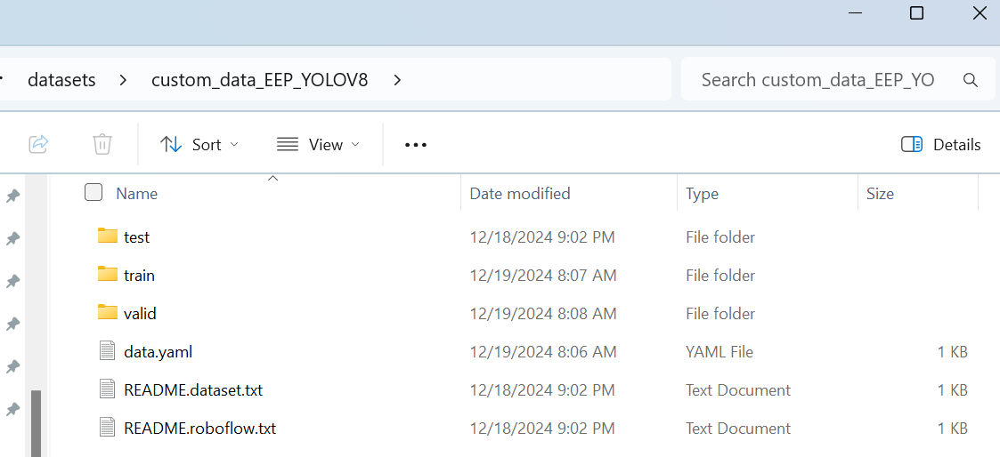

The Train, Test, and Val folders have two subfolders images and labels

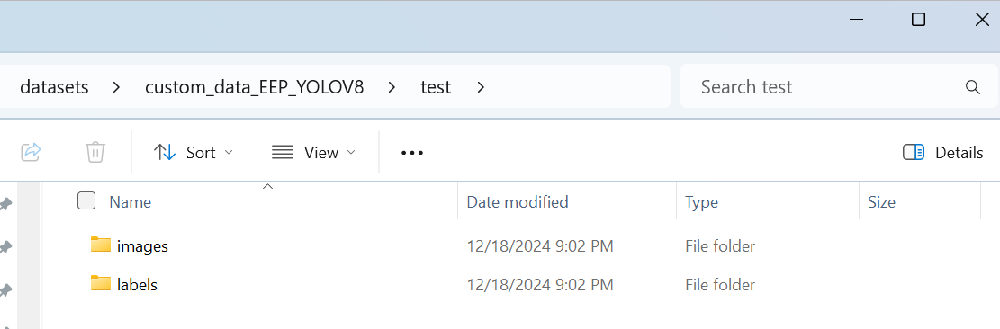

Sample images in folder:
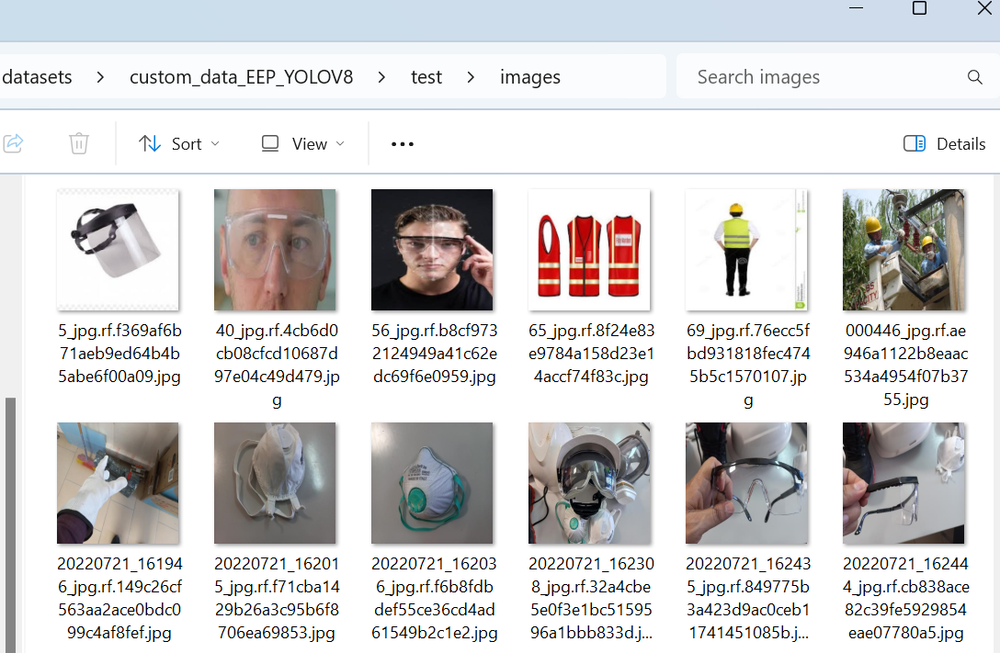

Sample annotation files in folder:
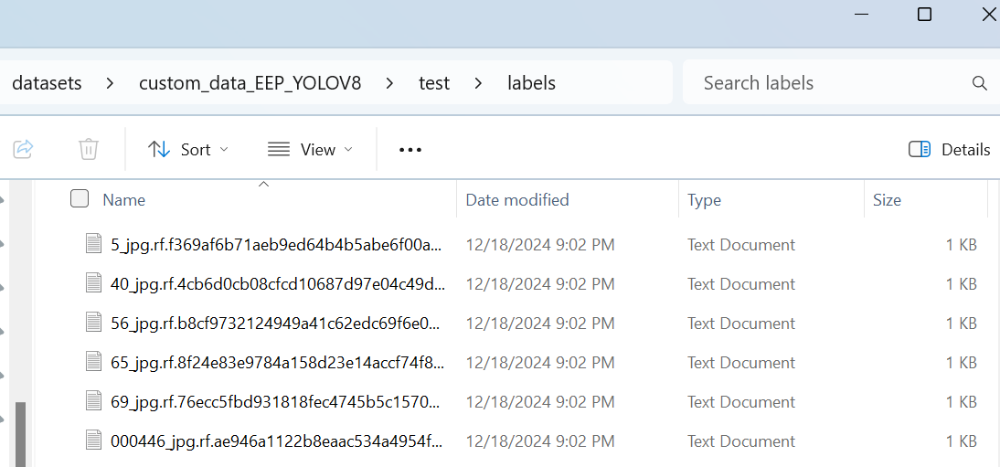

The annotation file is a simple txt file. The first element is the class, the other numbers represent coordinates of the bounding box. Note that there are various software to help with image annotation.
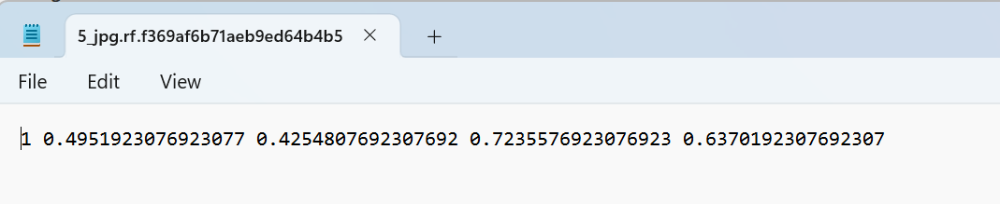

In [2]:
# Directory Path
HOME = os.getcwd()
print(HOME)

In [ ]:
# Dataset Directory
%cd {dataset.location}

In the dataset folder there is a file called data.yaml which should look like this:
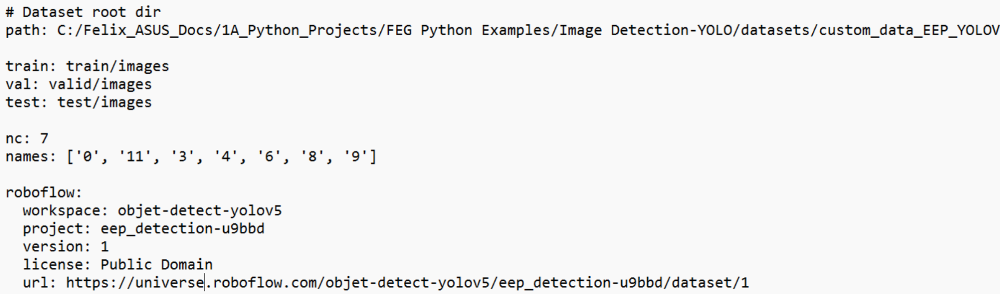

If running locally in your computer, make sure the path is updated ot the data.yaml file path. If running in a cloud environment (e.g., Google Colab) the path line is not needed.

In both cases, before running the model we can choose to update the classes in the data.yaml file to something more descriptive. To do that the data.yaml file classes need to be updated by changing the class names as follows:
- 0 to 'Hard_Hat'
- 8 to 'Gloves'
- 9 to 'Safety_Shoes'
- 3 to 'Safety_Vest'
- 4 to 'Mask'
- 6 to 'Safety_Glasses'
- 11 to 'Face_Shield'

Note that we need to keep the order of the list elements.

# Model Training with Custom Data

Note that the model training setp may take a few hours depending on the number of epochs utilized for training. The larger the epochs parameter the longer training will take.

Option 1 and option 2 specify various variations of the code and how to train the model using the custom dataset. 

## Option 1

Option 1 relies on model.train function.

In [ ]:
# Define YOLO Pretrained Model To Use
model = YOLO('yolov8n.pt') # Load the model.

In [ ]:
# Model Fine-Tuning and training with custom dataset
model_custom = model.train(data='/content/EEP_Detection-1/data.yaml', # YAML file with image data paths and directories
                           imgsz=640, # 
                           epochs=3, # EPOCHS used for deep learning model.
                           batch=1,
                           name='yolov8n_custom_1') # Name of Custom model.

In [ ]:
# Evaluate the model's performance on the validation set
results = model_custom.val()

In [ ]:
# Sample image for testing.
url = 'https://ultralytics.com/images/bus.jpg' 
response = urllib.request.urlopen(url)
image = mpimg.imread(BytesIO(response.read()), format='jpg')

# Shows sample image.
plt.imshow(image)
plt.axis('off') # Hide axes
plt.show()

In [ ]:
# Perform object detection on an image using the model
results = model_custom("https://ultralytics.com/images/bus.jpg")

In [ ]:
# Export the model to ONNX format
success = model.export(format="onnx")

## Option 2

This option relies on the !yolo function rather than the model.train function.

### Model Training/Fine-Tunning

In [ ]:
#!yolo task=detect mode=train model=yolov8n.pt data='/content/EEP_Detection-1/data.yaml' epochs=3 batch=8 imgsz=640 name=yolov8n_custom_2

# Model Performance

The various model performance metrics are saved in various files within the model directory.

In [ ]:
# Extract the save name where results where saved. 
# The model name below may need to be manually written as it may change each run.
model_result_save_name = 'yolov8n_custom_2' 

In [ ]:
# Use path results were saved above. This line of code shows files in the folder with Performance Metrics of the model training/testing
!ls {HOME}//EEP_Detection-1/runs/detect/{model_result_save_name}

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/EEP_Detection-1/runs/detect/{model_result_save_name}/confusion_matrix.png', width = 900) # Confusion Matrix

Confusion Matrix looks like the following.

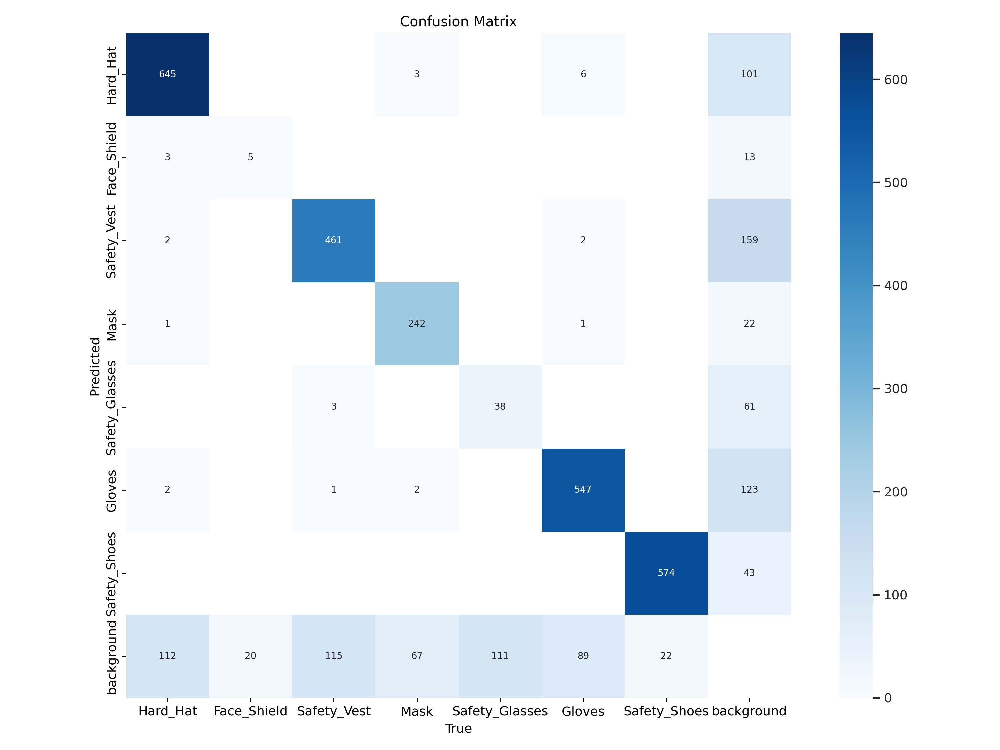

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/EEP_Detection-1/runs/detect/{model_result_save_name}/results.png', width = 1200) # Training/Validation Loss

Training/Validation loss looks liek the following:
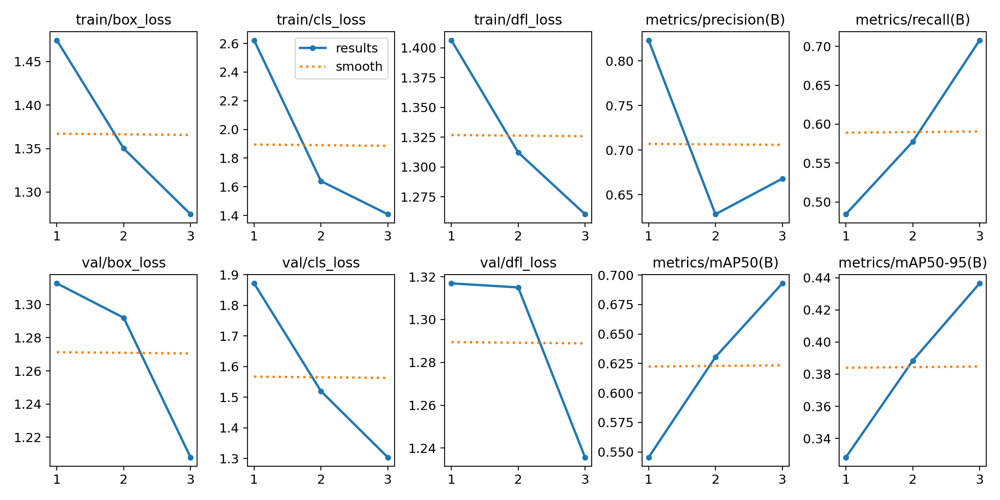

In [1]:
%cd {HOME}
Image(filename=f'{HOME}/EEP_Detection-1/runs/detect/{model_result_save_name}/val_batch0_pred.jpg', width = 900) # Sample Validation Results.

Sample validation results output.

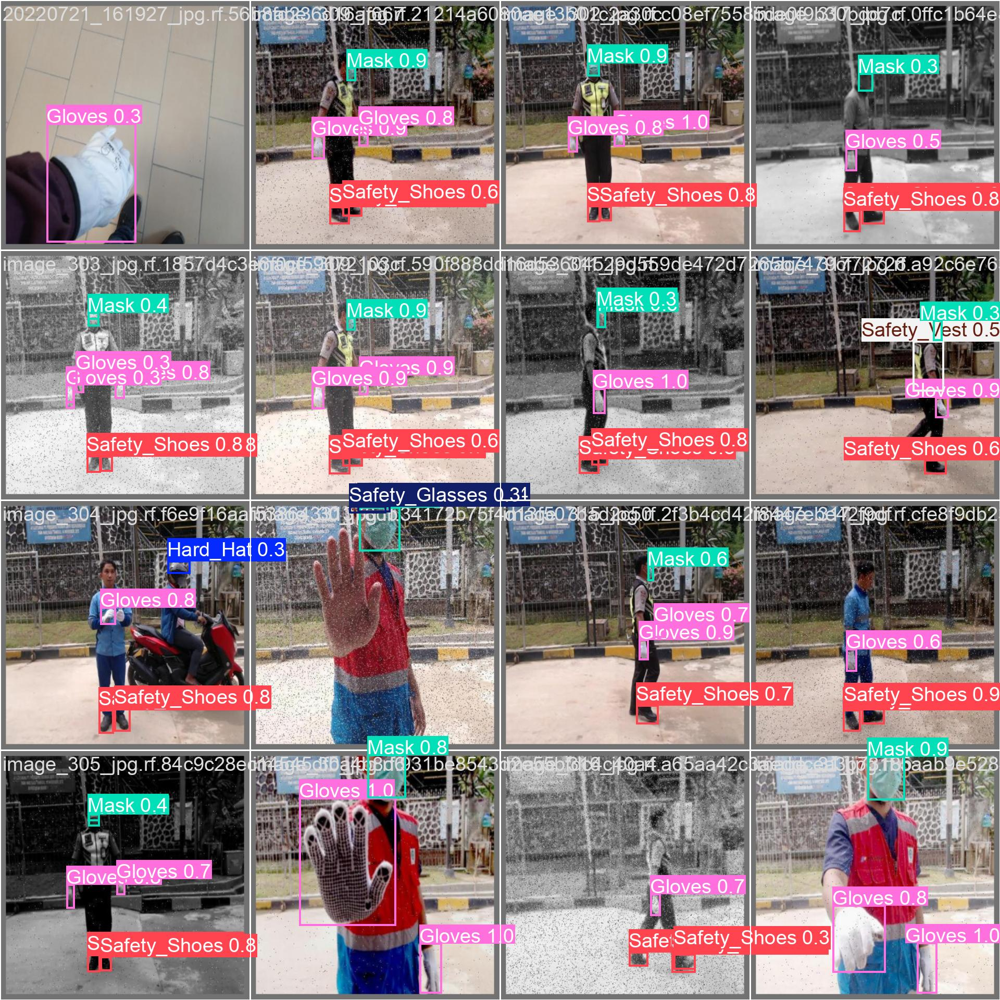

In [ ]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/EEP_Detection-1/runs/detect/{model_result_save_name}/weights/best.pt data='/content/EEP_Detection-1/data.yaml'
# Sample validation performance metrics.

The validation dataset is used for further exploring the model performance. Results look like the below image table where for each class we can see the performance metrics.
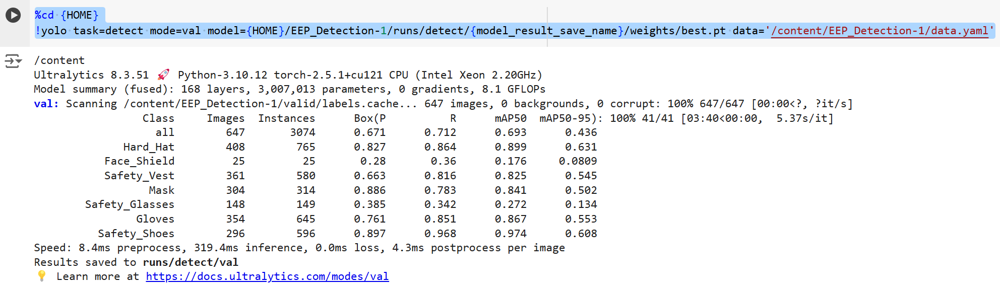

# Custom Model File

The model file is saved under the directory "/runs/detect/{last_model_save}/weights/best.pt"
The "best.pt" is the custom model file which now can be loaded and used in the same way as the pretrained model. Once the custom data model training has been completed it is recommended to extract this file and rename it with a more descriptive filename and use that for detection.

# NOTEBOOK END